In [1]:
import random
import torch
import pandas as pd
from matplotlib import pyplot as plt
from torchvision import transforms

import data_utils
import utils

In [2]:
from cbm import load_cbm

## Settings

In [5]:
# dataset_name = "imagenet_val"#"imagenet_val"#"cifar100_val"#places365_val
# target_name = "resnet50_imagenet"#vit_b_16_imagenet#"vit_l_32_imagenet"#"resnet50_imagenet"#"vgg16_bn_cifar100"
# target_layer = "layer4"#layer4#"encoder.layers.encoder_layer_23.mlp[1]"#"classifier[4]"
# target_neuron = 136#random.randint(0, 2048)
# batch_size = 256
# save_dir = 'saved_activations'
# device = "cuda"
# pool_mode = "avg"#"avg"#"first"

# model, preprocess = data_utils.get_target_model(target_name, device=device)

In [5]:
# for cbm
target_name = "cifar10_lf_cbm"
dataset_name = "cifar10"
target_layer = "proj_layer"
target_neuron = 0
batch_size = 64
save_dir = 'saved_activations'
device = "cuda"
pool_mode = "avg"#"avg"#"first"

In [ ]:
HOME="/home/jix049/private/"
# change this to the correct model dir, everything else should be taken care of
# load_dir = HOME+"saved_models/cub_lf_cbm"
# load_dir = "saved_models/cifar10_cbm_2024_09_29_08_44"
# load_dir = "saved_models/cifar10_cbm_2024_10_16_16_01"
# load_dir="saved_models/cifar100_cbm_2024_10_16_17_02"
load_dir="saved_models/cub_cbm_2024_10_20_19_48"
device = "cuda"
with open(os.path.join(load_dir, "args.txt"), "r") as f:
    args = json.load(f)
dataset = args["dataset"]
_, target_preprocess = data_utils.get_target_model(args["backbone"], device)
model = cbm.load_cbm(load_dir, device)

In [7]:
model, preprocess = data_utils.get_target_model(target_name, device=device)

/home/jix049/private/linear_explanations/cbm.py:67: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  W_c = torch.load(os.path.join(load_dir ,"W_c.pt"), map_location=device)
/ho

## Run required results

In [8]:
#setup transforms
try:
    pre_mean = torch.FloatTensor(preprocess.mean)
    pre_std = torch.FloatTensor(preprocess.std)
except(AttributeError):
    pre_mean = torch.FloatTensor(preprocess.transforms[-1].mean)
    pre_std = torch.FloatTensor(preprocess.transforms[-1].std)
anti_preprocess = transforms.Normalize(-1*pre_mean/pre_std, 1/pre_std)

to_image = transforms.ToPILImage()

In [10]:
dataset = data_utils.get_data(dataset_name, preprocess)
pil_data = data_utils.get_data(dataset_name)

UnboundLocalError: local variable 'data' referenced before assignment

In [10]:
target_neuron = 1
pool_mode = "avg"#"avg"#"first"

#special case for 1d activations
if target_layer == 'classifier[4]':
    activations = None
    save_path = '{}/{}_{}/{}/'.format(save_dir, target_name, dataset_name, target_layer)
    print(save_path)
    summary_activations = utils.save_summary_activations(model, dataset, device, target_layer, batch_size, save_path, pool_mode="avg")
    summary_activations = summary_activations[:, target_neuron]
elif target_layer =="proj_layer":
    activations = None
    save_path = '{}/{}_{}/{}/'.format(save_dir, target_name, dataset_name, target_layer)
    print(save_path)
    summary_activations = utils.save_summary_activations(model, dataset, device, target_layer, batch_size, save_path, pool_mode="avg")
    summary_activations = summary_activations[:, target_neuron]
elif pool_mode == 'first':
    activations = None
    save_path = '{}/{}_{}/{}/'.format(save_dir, target_name, dataset_name, target_layer)
    print(save_path)
    summary_activations = utils.save_summary_activations(model, dataset, device, target_layer, batch_size, save_path, pool_mode="first")
    summary_activations = summary_activations[:, target_neuron]

elif pool_mode == 'avg':
    neuron_save_path = '{}/{}_{}/{}/{}'.format(save_dir, target_name, dataset_name, target_layer, target_neuron)
    activations = utils.save_activations(model, dataset, device, target_layer, target_neuron, batch_size, neuron_save_path)
    #reshape ViT activations
    print(activations.shape)
    if len(activations.shape) == 2:
        n, s = activations.shape
        #calculate input size
        d = int((s-1)**0.5)
        activations = activations[:, 1:].reshape(n, d, d)
        summary_activations = activations.mean(dim=[1,2]).cuda()
    elif len(activations.shape) == 1:
        summary_activations = activations
        activations = None
    else:
        summary_activations = activations.mean(dim=[1,2]).cuda()

saved_activations/cub_lf_cbm_cub_val/proj_layer/


/home/jix049/private/linear_explanations/utils.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  activations = torch.load(act_path, map_location = device)


In [11]:
# import torch
# import torch.nn as nn

# def investigate_and_fix_model(model):
#     print("Model Information:")
#     print("-----------------")

#     # Check and fix device consistency
#     device = next(model.parameters()).device
#     print(f"Target Device: {device}")

#     def move_to_device(module):
#         for param in module.parameters():
#             param.data = param.data.to(device)
#         for buffer in module.buffers():
#             buffer.data = buffer.data.to(device)

#     model.apply(move_to_device)
    
#     print(f"Model Class: {model.__class__.__name__}")
#     total_params = sum(p.numel() for p in model.parameters())
#     trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
#     print(f"Total Parameters: {total_params:,}")
#     print(f"Trainable Parameters: {trainable_params:,}")
    
#     print("\nModel Architecture:")
#     print(model)
    
#     layer_types = set(type(module).__name__ for module in model.modules())
#     print("\nLayer Types Used:")
#     for layer_type in layer_types:
#         print(f"- {layer_type}")
    
#     if hasattr(model, 'input_shape'):
#         print(f"\nExpected Input Shape: {model.input_shape}")
#     else:
#         print("\nExpected Input Shape: Not specified in model")
    
#     try:
#         # CIFAR-100 images are 32x32 RGB
#         sample_input = torch.randn(1, 3, 224, 224).to(device)
#         with torch.no_grad():
#             output = model(sample_input)
#         print(output)
#         # print(f"\nOutput Shape (for sample input): {output.shape}")
#     except Exception as e:
#         print(f"\nCouldn't determine output shape: {str(e)}")
#         print("Error details:")
#         import traceback
#         traceback.print_exc()
    
#     print(f"\nModel Mode: {'Training' if model.training else 'Evaluation'}")
#     print(f"Model Device: {device}")

#     return model,output  # Return the model in case any fixes were applied

# # Usage
# model,output = investigate_and_fix_model(model)

In [12]:
import argparse
import explain_neurons

In [13]:
batch_size = 64

In [14]:
# Generate Linear explanations
# # Create an argparse.Namespace object using the pre-defined variables
# args = argparse.Namespace(
#     mode='siglip',  # Assuming 'label' mode, change if needed
#     device=device,
#     dataset_name=dataset_name,
#     batch_size=batch_size,
#     activations_dir=save_dir,
#     result_dir='results',
#     clip_name='ViT-L-16-SigLIP-384',  # This wasn't in your variables, so using default
#     concept_set=None,
#     target_name=target_name,
#     target_layer=target_layer,
#     start_neuron=0,
#     end_neuron=208,#824
#     max_length=10,  # Using default value
#     tolerance=0.02,  # Using default value
#     glm_neuron_batch=128,  # Using default value
#     glm_lambda=0.05,  # Using default value
#     pool_mode=pool_mode
# )

# # # Now you can call the explain_neurons function
# explain_neurons.explain_neurons(args)

In [15]:
# activations=utils.get_target_activations(model, dataset, [target_layer], batch_size=batch_size, device=device, pool_mode=pool_mode)

## Load results from existing methods

In [16]:
def linear_to_str(df, target_neuron):
    df = df[df["unit"]==target_neuron]
    
    desc = "{:.2f}∙{}".format(df["weight0"].iloc[0], df["concept0"].iloc[0])
    
    for k in range(1, 10):
        concept = df["concept{}".format(k)].iloc[0]
        if str(concept) != "0":
            desc += " + {:.2f}∙{}".format(df["weight{}".format(k)].iloc[0], concept)
    desc += " + {:.2f}".format(df["bias"].iloc[0])
    return desc

explanations = {"le_label":None, "le_siglip":None, "clip_dissect":None} 

for method in explanations:
    try:
        explanation_path = "results/{}_{}_{}.csv".format(method,target_name, target_layer)
        df = pd.read_csv(explanation_path)
        if method.startswith("le_"):
            explanations[method] = linear_to_str(df, target_neuron)
        else:
            explanations[method] = df[df["unit"]==target_neuron]["description"].iloc[0]
    except(FileNotFoundError):
        explanations[method] = "N/A"
    

## Visualize neuron

In [17]:
def plot_images(images, axs):
    """
    images: list
    """
    
    for i, top_id in enumerate(images):
        #normalize to 0-1 range
        if activations != None:
            curr_act = activations[top_id]
            curr_act -= curr_act.min()
            curr_act /= curr_act.max()
            mask = curr_act.unsqueeze(0)
        else:
            mask = torch.ones((1, 1, 1))
                    
        x, label = dataset[top_id]
        x = anti_preprocess(x)
        mask_resize = transforms.Resize((x.shape[1], x.shape[2]), antialias=True)
        mask = mask_resize(mask).cpu()
        x = x * mask
        im = to_image(x)
        axs[i].imshow(im)
        axs[i].axis('off')

In [18]:
nice_names = {"net_dissect": "Network Dissection",
              "milan": "MILAN",
              "clip_dissect": "CLIP-Dissect",
              "le_label": "LE(Label)",
              "le_siglip": "LE(SigLIP)"}

In [19]:
def read_concepts_from_file(filename):
    concepts = []
    with open(filename, 'r') as file:
        for line in file:
            # Strip whitespace and add non-empty lines to the list
            concept = line.strip()
            if concept:
                concepts.append(concept)
    return concepts

# Example usage
filename = f"/home/jix049/private/saved_models/{target_name}/concepts.txt"
true_concepts= read_concepts_from_file(filename)

In [15]:
# sorted_act_vals, sorted_act_ids = torch.sort(summary_activations, descending=True)

# print("Neuron {} - Descriptions and highly activating images \n".format(int(target_neuron)))

# for i, method in enumerate(explanations):
#     print("{}: {}".format(nice_names[method], explanations[method]))

# #nums = [0, 5, 20, 50, 200, 500, 2000, 5000, 10000, 20000]
# nums = [0, 5, 50]

# n_images = 4
# fig, ax = plt.subplots(nrows = len(nums[1:]), ncols=n_images, figsize=(2*n_images, 2.2*len(nums[1:])))

# for i, num in enumerate(nums[1:]):
#     prev_num = nums[i]
#     ax[i, 0].set_title("Top:{:.2f}%-{:.2f}% Images, Activations:({:.2f}-{:.2f})".format(prev_num/len(summary_activations)*100,
#                                                                                         num/len(sorted_act_ids)*100,
#                                                                                         sorted_act_vals[num], sorted_act_vals[prev_num]),
#                                                                                         loc="left")
#     torch.manual_seed(42)  # or any other fixed number
#     perm = torch.randperm(num-prev_num)
#     to_show = sorted_act_ids[prev_num:][perm[:n_images]]
#     # to_show = sorted_act_ids[prev_num:num][:n_images]
#     plot_images(to_show, axs=ax[i])

# #plt.tight_layout()
# plt.show()

In [20]:
from IPython.display import display, HTML

display(HTML('''
    <script>
        IPython.OutputArea.prototype._should_scroll = function(lines) {
            return false;
        }
    </script>
    <style>
        .output_wrapper, .output {
            height:auto !important;
            max-height:none;
        }
        .output_scroll {
            box-shadow:none !important;
            webkit-box-shadow:none !important;
        }
    </style>
'''))

In [21]:
def wrap_text(text, max_width=80):
    words = text.split()
    lines = []
    current_line = []
    current_length = 0

    for word in words:
        if current_length + len(word) + 1 > max_width:
            lines.append(' '.join(current_line))
            current_line = [word]
            current_length = len(word)
        else:
            current_line.append(word)
            current_length += len(word) + 1

    if current_line:
        lines.append(' '.join(current_line))

    return '\n'.join(lines)

In [22]:
import math

In [69]:
all_activations = utils.save_summary_activations(model, dataset, device, target_layer, batch_size, save_path, pool_mode="avg")
# target_neurons=range(40,45,1)
target_neurons=[32]


/home/jix049/private/linear_explanations/utils.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  activations = torch.load(act_path, map_location = device)


Neuron 32 - a duck-like bird
CLIP-Dissect: a duck-like bird
LE(SigLIP): 1.16∙duck + 0.71∙Eared Grebe + 0.41∙a seabird + -0.37


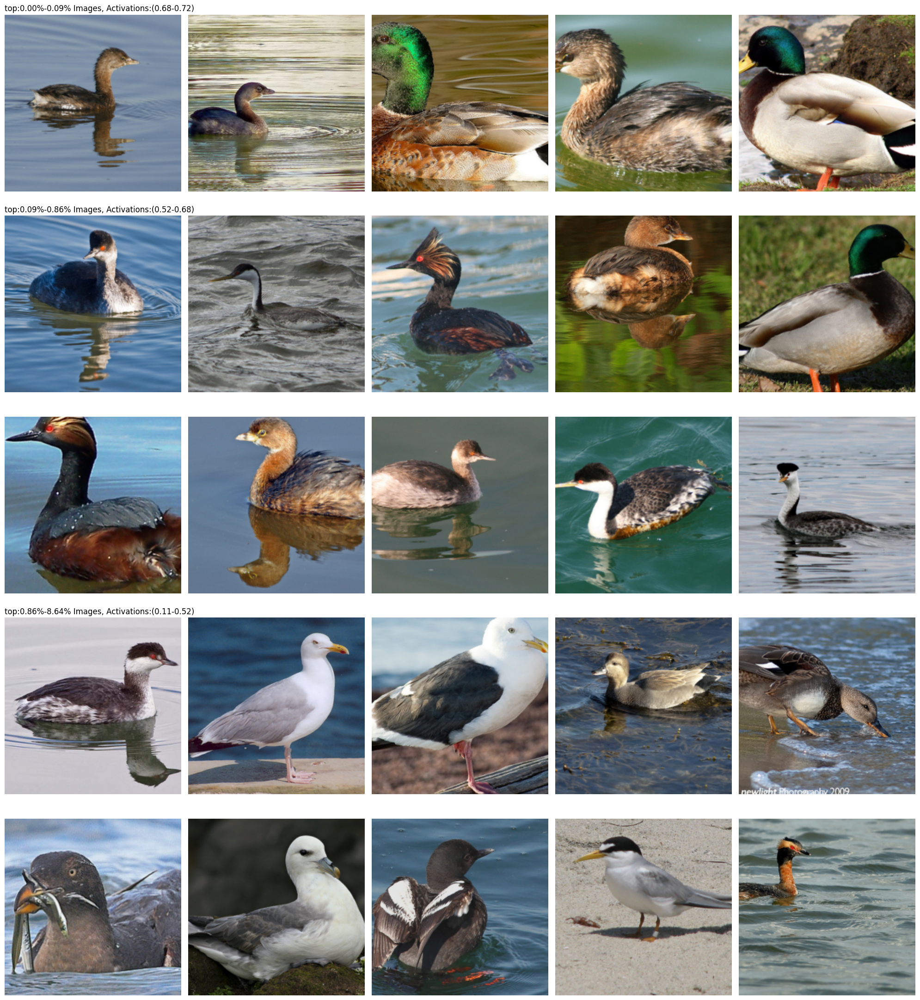

In [70]:
all_activations = utils.save_summary_activations(model, dataset, device, target_layer, batch_size, save_path, pool_mode="avg")
for i in target_neurons:
    target_neuron=i
    summary_activations = all_activations[:, target_neuron]
    sorted_act_vals, sorted_act_ids = torch.sort(summary_activations, descending=True)

    explanations = {"clip_dissect":None, "le_label":None, "le_siglip":None} 

    for method in explanations:
        try:
            explanation_path = "results/{}_{}_{}.csv".format(method,target_name, target_layer)
            df = pd.read_csv(explanation_path)
            if method.startswith("le_"):
                explanations[method] = linear_to_str(df, target_neuron)
            else:
                explanations[method] = df[df["unit"]==target_neuron]["description"].iloc[0]
        except(FileNotFoundError):
            explanations[method] = "N/A"

    print("Neuron {} - {}".format(int(target_neuron),true_concepts[i]))
    for i, method in enumerate(explanations):
        if explanations[method] != "N/A":
            method_name = nice_names[method]
            explanation = explanations[method]
            wrapped_explanation = wrap_text(explanation, max_width=80 - len(method_name) - 2)  # -2 for ": "
            explanation_lines = wrapped_explanation.split('\n')
            print(f"{method_name}: {explanation_lines[0]}")
            for line in explanation_lines[1:]:
                print(line)

    nums = [0, 5, 50, 500]
    n_images = 10

    # Calculate total number of rows needed
    total_rows = sum([math.ceil(min(n_images, num - prev_num) / 5) for prev_num, num in zip(nums[:-1], nums[1:])])

    fig, ax = plt.subplots(nrows=total_rows, ncols=5, figsize=(4*5, 4.4*total_rows))

    row_index = 0
    for i, num in enumerate(nums[1:]):
        prev_num = nums[i]
        available_images = num - prev_num
        images_to_show = min(n_images, available_images)

        rows_needed = math.ceil(images_to_show / 5)

        ax[row_index, 0].set_title("top:{:.2f}%-{:.2f}% Images, Activations:({:.2f}-{:.2f})".format(
            prev_num/len(summary_activations)*100,
            num/len(sorted_act_ids)*100,
            sorted_act_vals[num], sorted_act_vals[prev_num]),
            loc="left")

        torch.manual_seed(42)  # or any other fixed number
        perm = torch.randperm(available_images)
        to_show = sorted_act_ids[prev_num:num][perm[:images_to_show]]

        for j in range(images_to_show):
            row = row_index + j // 5
            col = j % 5
            plot_images([to_show[j]], axs=[ax[row, col]])

        # Hide unused axes
        for j in range(images_to_show, rows_needed * 5):
            row = row_index + j // 5
            col = j % 5
            ax[row, col].axis('off')

        row_index += rows_needed

#     # Remove any unused subplots
#     for i in range(row_index, total_rows):
#         for j in range(5):
#             fig.delaxes(ax[i, j])

    plt.tight_layout()
    plt.show()


Neuron 32 - a duck-like bird
CLIP-Dissect: a duck-like bird
LE(SigLIP): 1.16∙duck + 0.71∙Eared Grebe + 0.41∙a seabird + -0.37


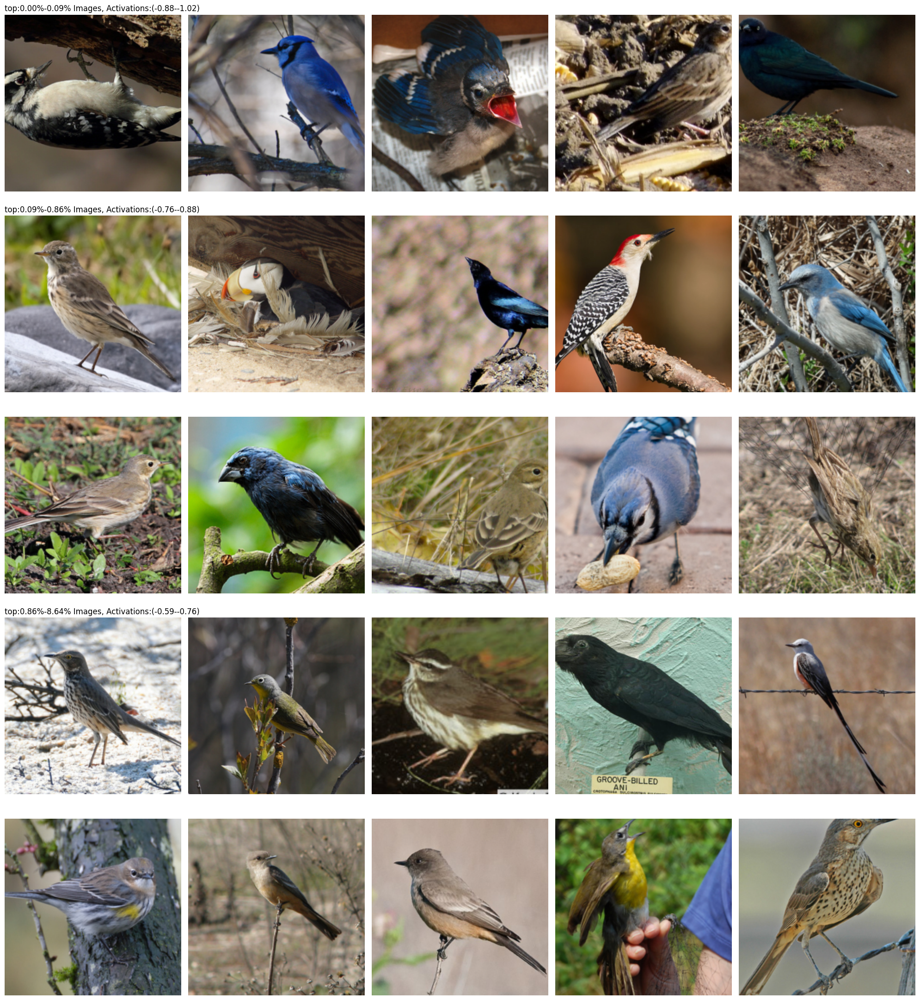

In [71]:

for i in target_neurons:
# for i in range(5,15,1):
    target_neuron=i
    summary_activations = all_activations[:, target_neuron]
    sorted_act_vals, sorted_act_ids = torch.sort(summary_activations, descending=False)

    explanations = {"clip_dissect":None, "le_label":None, "le_siglip":None} 

    for method in explanations:
        try:
            explanation_path = "results/{}_{}_{}.csv".format(method,target_name, target_layer)
            df = pd.read_csv(explanation_path)
            if method.startswith("le_"):
                explanations[method] = linear_to_str(df, target_neuron)
            else:
                explanations[method] = df[df["unit"]==target_neuron]["description"].iloc[0]
        except(FileNotFoundError):
            explanations[method] = "N/A"

    print("Neuron {} - {}".format(int(target_neuron),true_concepts[i]))
    for i, method in enumerate(explanations):
        if explanations[method] != "N/A":
            method_name = nice_names[method]
            explanation = explanations[method]
            wrapped_explanation = wrap_text(explanation, max_width=80 - len(method_name) - 2)  # -2 for ": "
            explanation_lines = wrapped_explanation.split('\n')
            print(f"{method_name}: {explanation_lines[0]}")
            for line in explanation_lines[1:]:
                print(line)

    nums = [0, 5, 50, 500]
    n_images = 10

    # Calculate total number of rows needed
    total_rows = sum([math.ceil(min(n_images, num - prev_num) / 5) for prev_num, num in zip(nums[:-1], nums[1:])])

    fig, ax = plt.subplots(nrows=total_rows, ncols=5, figsize=(4*5, 4.4*total_rows))

    row_index = 0
    for i, num in enumerate(nums[1:]):
        prev_num = nums[i]
        available_images = num - prev_num
        images_to_show = min(n_images, available_images)

        rows_needed = math.ceil(images_to_show / 5)

        ax[row_index, 0].set_title("top:{:.2f}%-{:.2f}% Images, Activations:({:.2f}-{:.2f})".format(
            prev_num/len(summary_activations)*100,
            num/len(sorted_act_ids)*100,
            sorted_act_vals[num], sorted_act_vals[prev_num]),
            loc="left")

        torch.manual_seed(42)  # or any other fixed number
        perm = torch.randperm(available_images)
        to_show = sorted_act_ids[prev_num:num][perm[:images_to_show]]

        for j in range(images_to_show):
            row = row_index + j // 5
            col = j % 5
            plot_images([to_show[j]], axs=[ax[row, col]])

        # Hide unused axes
        for j in range(images_to_show, rows_needed * 5):
            row = row_index + j // 5
            col = j % 5
            ax[row, col].axis('off')

        row_index += rows_needed

#     # Remove any unused subplots
#     for i in range(row_index, total_rows):
#         for j in range(5):
#             fig.delaxes(ax[i, j])

    plt.tight_layout()
    plt.show()

Save outputs